# Installation des librairies

In [1]:
!pip install --upgrade pip
!pip install -q -q -q tifffile
!pip install -q -q -q tqdm
!pip install opencv-python-headless
!pip3 install torch==1.9.0+cu102 torchvision==0.10.0+cu102 torchaudio===0.9.0 -f https://download.pytorch.org/whl/torch_stable.html
!pip -q -q -q install wandb
!pip install openpyxl xlsxwriter xlrd
import s3fs


     |████████████████████████████████| 1.7 MB 1.5 MB/s eta 0:00:01
  Attempting uninstall: pip
    Found existing installation: pip 20.2.4
    Uninstalling pip-20.2.4:
      Successfully uninstalled pip-20.2.4
     |████████████████████████████████| 37.1 MB 13.5 MB/s            
Looking in links: https://download.pytorch.org/whl/torch_stable.html
     |████████████████████████████████| 831.4 MB 25 kB/s              
     |████████████████████████████████| 22.1 MB 19.8 MB/s            
     |████████████████████████████████| 1.9 MB 1.7 MB/s            
     |████████████████████████████████| 242 kB 1.8 MB/s            
     |████████████████████████████████| 148 kB 14.8 MB/s            
     |████████████████████████████████| 96 kB 9.3 MB/s             


In [ ]:
!pip install --upgrade Pillow

In [2]:
import shutil

fs = s3fs.S3FileSystem(client_kwargs={'endpoint_url': 'https://minio.lab.sspcloud.fr'})
fs.get('projet-challengedata-ens/data/additional_files_earthcube_emu4zqr.zip', 'additional_files_earthcube_emu4zqr.zip')
shutil.unpack_archive('additional_files_earthcube_emu4zqr.zip')

# Lecture des librairies et framework

In [1]:
%load_ext autoreload
#%autoreload 2

import torch
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from torch.utils.data.dataset import Dataset
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import os


import torch.onnx as onnx
import torchvision.models as models

from pathlib import Path
import random

import numpy as np
from tifffile import TiffFile
import matplotlib.pyplot as plt
import colorsys
import PIL
from PIL import Image 
from tqdm import tqdm
import matplotlib.patches as mpatches
import time
import warnings
warnings.filterwarnings('ignore')

from framework.dataset import LandCoverData as LCD

import wandb

device= torch.device("cuda:0" )#if torch.cuda.is_available() else "cpu")
# Assuming that we are on a CUDA machine, this should print a CUDA device:
print("Using {} device".format(device))
print("nom du GPU :", torch.cuda.get_device_name(device=None))
print("GPU initialisé : ", torch.cuda.is_initialized())

Using cuda:0 device
nom du GPU : Tesla T4
GPU initialisé :  True


In [2]:
from Quentin.framework.dataset  import CustomDataset, LandCoverData, CustomTestDataset, CustomDatasetSnow


from Quentin.framework.models  import NeuralNetwork, NeuralNetworkSnow, NeuralNetwork2, NeuralNetwork3

from Quentin.framework.train  import train_model_Unet, model_unet

In [ ]:

fs = s3fs.S3FileSystem(client_kwargs={'endpoint_url': 'https://minio.lab.sspcloud.fr'})
fs.get('projet-challengedata-ens/data/Model_Quentin_epoch_125.pth', 'Model_Quentin_epoch_125.pth')

# Téléchargement + lecture des images de la BDD

In [ ]:
start = time.perf_counter()

DATA_FOLDER_STR = 'dataset'
DATA_FOLDER = Path(DATA_FOLDER_STR).expanduser()
# path to the unzipped dataset: contains directories train/ and test/
DATASET_FOLDER = DATA_FOLDER

# get all train images and masks
train_images_paths = sorted(list(DATASET_FOLDER.glob('train/images/*.tif')))
train_masks_paths = sorted(list(DATASET_FOLDER.glob('train/masks/*.tif')))
# get all test images
test_images_paths = sorted(list(DATASET_FOLDER.glob('test/images/*.tif')))
end = time.perf_counter()
print("temps en seconde : ", end - start)

# Config Unet

In [ ]:
%load_ext autoreload
#%autoreload 2
from Quentin.framework.dataset  import CustomDataset, LandCoverData, CustomTestDataset, CustomDatasetSnow


from Quentin.framework.models  import NeuralNetwork, NeuralNetworkSnow

from Quentin.framework.train  import train_model_Unet, model_unet
import torch
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from torch.utils.data.dataset import Dataset
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import os

import shutil

import torch.onnx as onnx
import torchvision.models as models

from pathlib import Path
import random

import numpy as np
from tifffile import TiffFile
import matplotlib.pyplot as plt
import colorsys
import PIL
from PIL import Image 
from tqdm import tqdm
import matplotlib.patches as mpatches
import time
import warnings
warnings.filterwarnings('ignore')

from framework.dataset import LandCoverData as LCD

import wandb

device= torch.device("cuda:0" )#if torch.cuda.is_available() else "cpu")
# Assuming that we are on a CUDA machine, this should print a CUDA device:
print("Using {} device".format(device))
print("nom du GPU :", torch.cuda.get_device_name(device=None))
print("GPU initialisé : ", torch.cuda.is_initialized())

config ={
    'monitoring' : True,
    'freq monitoring':20,
    'n_epoch' : 75,
    'train_size' : 12956,
    'batch_size' :  20,
    'lr' : 0.007,
    'betas' : (0.85, 0.999),
    'eps' : 1e-08,
    'momentum' : 0.9,
    'optimizer' : "SGD",
    'eps_KL' : 10**(-8),
    'weighted' : True,
    #
    'valeur_weight' :   np.array([0.0, 10.0, 5.0, 1.0, 2, 8.0, 2.0, 20.0, 100.0, 5]),
     #                     no_data clouds       artificial       cultivated        broadleaf         coniferous          herbaceous          natural          snow         water        
    #'valeur_weight' :np.array([0,  0,           0.198754437210134,0.029939303265005,0.043746282715736,0.125612927780885,0.036346738148521,1.23968246073392,114.9036041083,0.412121222509195]),
    'test': True,
    'test_snow': False, 
    'model_load': False,
    'model_name': 'sdfghjk',
    'model type': "Unet",
    'descriptif': "Boss is Back in the Game"
}
from Quentin.framework.models2  import UNet
NN= UNet()
model = nn.Sequential(
    NN,
    nn.Softmax(1)
).to(device)
print("Model créé")
from Quentin.framework.run  import Exemple
mask_cal = Exemple(config, device, model)

In [ ]:
b=2
b

In [ ]:
NeuralNetwork = NeuralNetwork()
model = nn.Sequential(
    NeuralNetwork,
    nn.Softmax(1)
).to(device)
print("Model créé")

In [ ]:
model = nn.Sequential(
    NeuralNetwork,
    nn.Softmax(1)
).to(device)
model.load_state_dict(torch.load('model_Quentin.pth'))
print("model chargé")

In [ ]:
train_model_Unet(model, config, trainloader, testloader)

### mask_cal = model_unet(model, config, testloader)

In [ ]:
torch.save(model.state_dict(), "Model_rate.pth")
print("Model enregistré")


In [ ]:
from Quentin.framework.dataset  import CustomTestDataset
from Quentin.framework.train  import train_model_Unet, model_test_unet

DATA_FOLDER_STR = 'dataset'
DATA_FOLDER = Path(DATA_FOLDER_STR).expanduser()
# path to the unzipped dataset: contains directories train/ and test/
DATASET_FOLDER = DATA_FOLDER
test_paths = sorted(list(DATASET_FOLDER.glob('test/images/*.tif')))
batch = config['batch_size']
test = CustomTestDataset(test_paths, train=False)
testimgloader = DataLoader(test, batch_size=batch, shuffle=False)
mask_cal = model_test_unet(model, config, testimgloader)

In [2]:
from Quentin.framework.dataset  import CustomTestDataset
from Quentin.framework.train  import train_model_Unet, model_test_unet
DATA_FOLDER_STR = 'dataset'
DATA_FOLDER = Path(DATA_FOLDER_STR).expanduser()
# path to the unzipped dataset: contains directories train/ and test/
DATASET_FOLDER = DATA_FOLDER
# get all train images and masks
train_images_paths = sorted(list(DATASET_FOLDER.glob('train/images/*.tif')))
train_masks_paths = sorted(list(DATASET_FOLDER.glob('train/masks/*.tif')))


In [ ]:
#création du train
train_dataset = CustomDataset(train_images_paths, train_masks_paths, train=True)
trainloader = DataLoader(train_dataset, batch_size=config['batch_size'], shuffle=False)

mask_cal = model_test_unet(model, config, trainloader)

In [ ]:
from Quentin.framework.utils  import ecrire_excel
ecrire_excel(mask_cal, 'test')

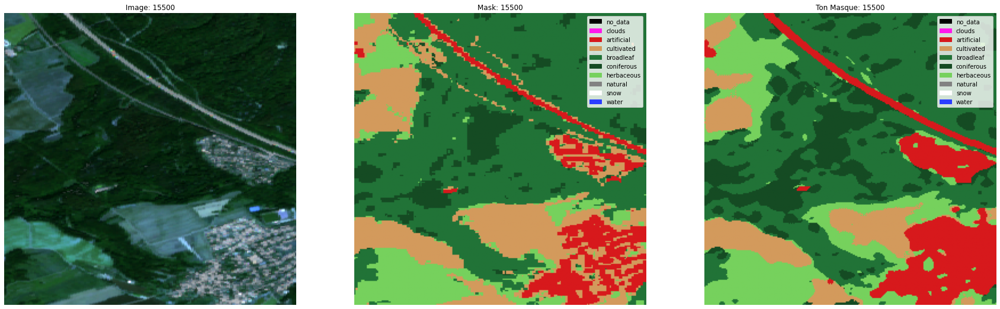

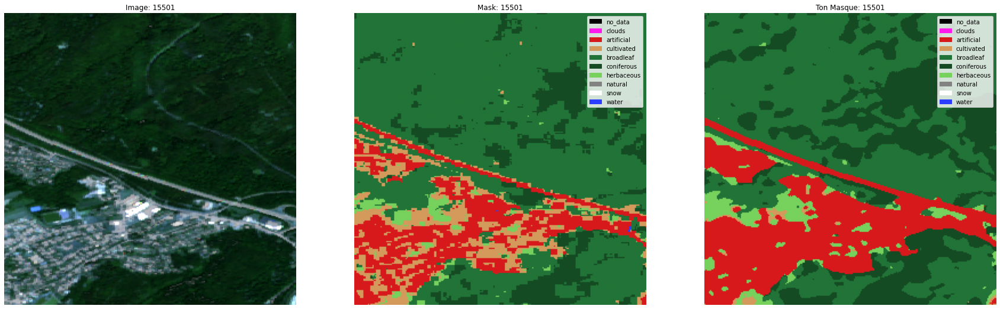

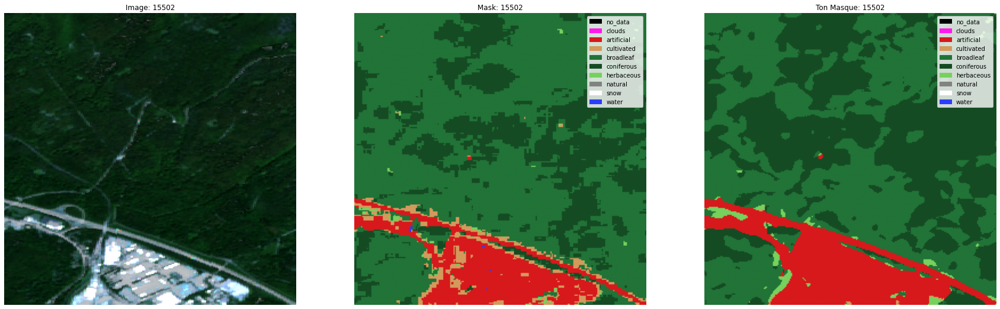

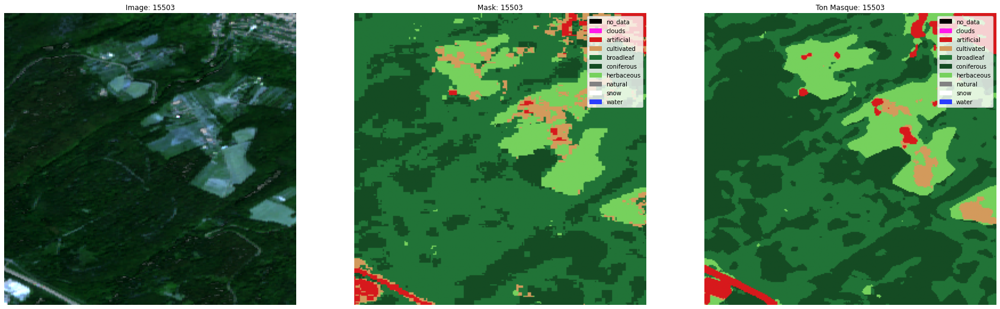

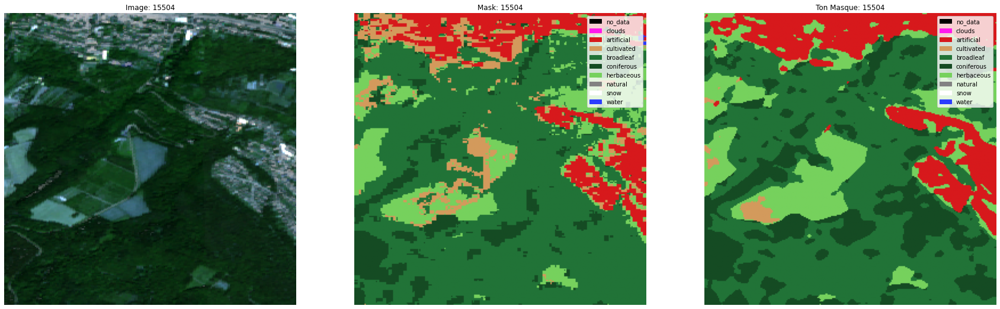

...

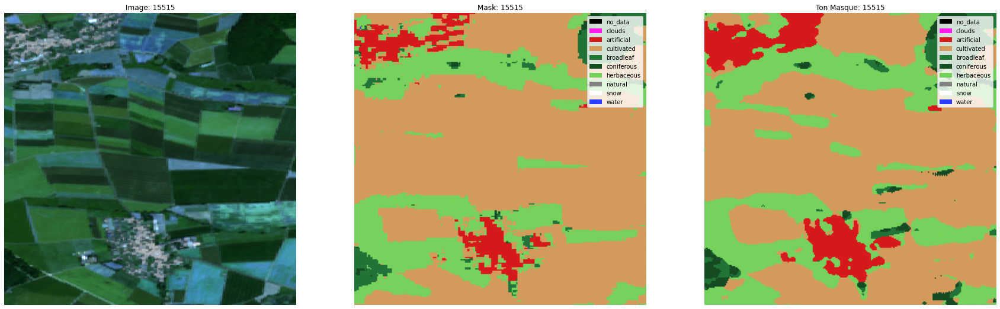

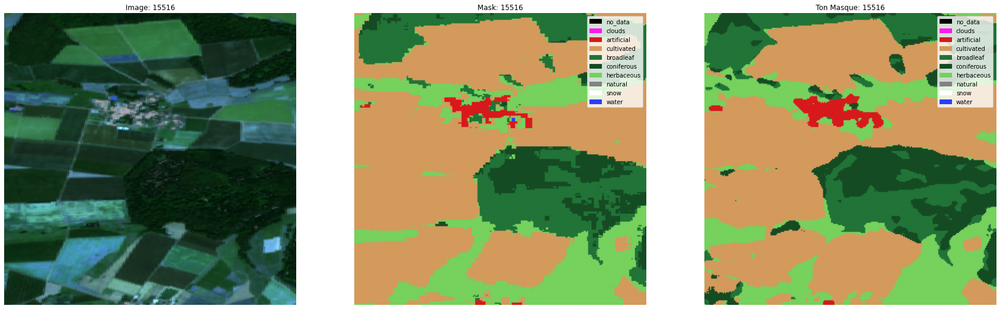

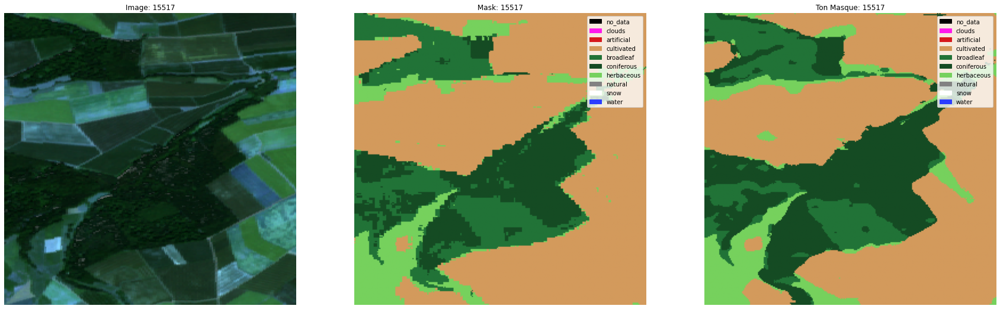

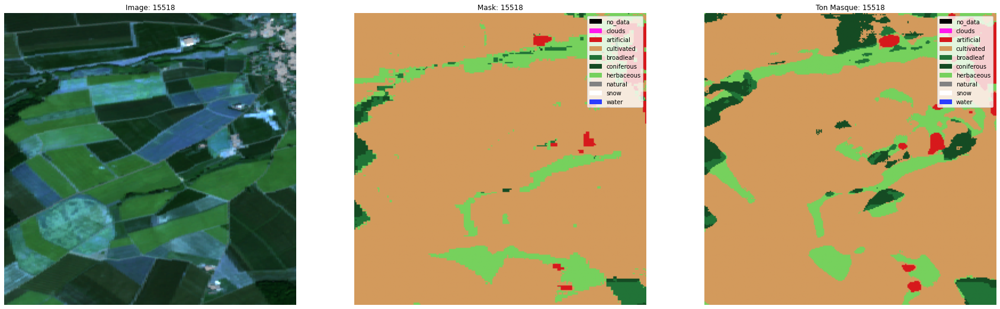

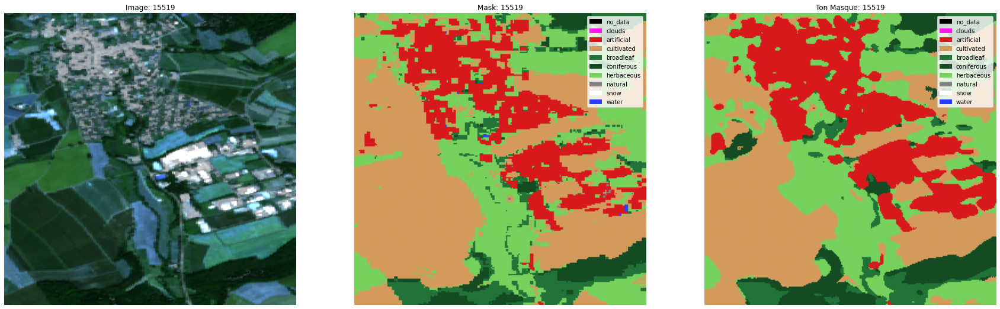

In [14]:
from Quentin.framework.utils  import show_all
for i in range (20):
    
#3449,3450,3837,3560,3671,3438,3484,3518,3519,3531,3533,3805,3836,4000,4001,4047,3496,3583,3581,3629,3582,3628,3882,3672,3627,3541,3804,3540,3763,3803,3808,3545,3544,4046,3542, 3589,3590,4091, 3656,3702,3452,3498]
    show_all(image_path=train_images_paths, mask_path=True, mask_cal=mask_cal, idx=15500+i, legend_masque=True)


In [ ]:
mask_cal

In [ ]:
from Quentin.framework.models  import NeuralNetwork, NeuralNetworkSnow, NeuralNetwork2
NN2 = NeuralNetwork2()
model = nn.Sequential(
    NN2,
    nn.Softmax(1)
).to(device)
print(done)

# Test pour Snow

In [ ]:
%load_ext autoreload
#%autoreload 2

import torch
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from torch.utils.data.dataset import Dataset
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import os

import shutil

import torch.onnx as onnx
import torchvision.models as models

from pathlib import Path
import random

import numpy as np
from tifffile import TiffFile
import matplotlib.pyplot as plt
import colorsys
import PIL
from PIL import Image 
from tqdm import tqdm
import matplotlib.patches as mpatches
import time
import warnings
warnings.filterwarnings('ignore')

from Quentin.framework.dataset import LandCoverData as LCD

import wandb

device= torch.device("cuda:0" )#if torch.cuda.is_available() else "cpu")
# Assuming that we are on a CUDA machine, this should print a CUDA device:
print("Using {} device".format(device))
print("nom du GPU :", torch.cuda.get_device_name(device=None))
print("GPU initialisé : ", torch.cuda.is_initialized())
config ={
    'monitoring' : True,
    'freq monitoring':3,
    'n_epoch' : 1,
    'train_size' : 20,
    'batch_size' :  5,
    'lr' : 0.007, 
    'betas' : (0.9, 0.999),
    'eps' : 1e-08,
    'momentum' : 0.9,
    'optimizer' : "Adam",
    'eps_KL' : 10**(-8),
    'weighted' : True,
    'model type': "Unet",
    'test': True,
    'descriptif': "entrainement avec un unet pour la neige"
}
print(LCD.WEIGHT_CLASS_TEST_CLOUDS_SNOW)
from Quentin.framework.run  import ExempleSnow
mask_cal = ExempleSnow(config, device)

In [ ]:
from Quentin.framework.utils  import show_all
DATA_FOLDER_STR = 'dataset'
DATA_FOLDER = Path(DATA_FOLDER_STR).expanduser()
# path to the unzipped dataset: contains directories train/ and test/
DATASET_FOLDER = DATA_FOLDER
train_images_paths = sorted(list(DATASET_FOLDER.glob('train/images/*.tif')))
len_data = len(train_images_paths)
train_image_paths = train_images_paths[:int(len_data)]
show_all(image_path=train_images_paths, mask_path=True, mask_cal=mask_cal, idx=3627, legend_masque=False)

In [ ]:
train_model_Unet(modelsnow, config, trainloader_clouds_snow, testloader_clouds_snow, test_clouds_snow=True)

# Debugg

In [ ]:
DATA_FOLDER_STR = 'dataset'
DATA_FOLDER = Path(DATA_FOLDER_STR).expanduser()
# path to the unzipped dataset: contains directories train/ and test/
DATASET_FOLDER = DATA_FOLDER
# get all train images and masks
train_images_paths = sorted(list(DATASET_FOLDER.glob('train/images/*.tif')))
train_masks_paths = sorted(list(DATASET_FOLDER.glob('train/masks/*.tif')))
train_dataset = CustomDatasetSnow(train_images_paths, train_masks_paths, train=True)
trainloader = DataLoader(train_dataset, batch_size=32, shuffle=True)

X = next(iter(trainloader))

NN = NeuralNetwork()
model = nn.Sequential(
    NN,
    nn.Softmax(1)
)
print("Model créé")

In [ ]:
mask = np.array(X['masque'])
masques_cal = model(X['image'])
output = np.array(masques_cal.detach())
masques_cal = np.array(np.argmax(output,axis=1))


In [ ]:
masques_inter_mask = np.zeros(10)
masques_union_mask2 = np.zeros(10)
pmask = np.zeros(10)
pmasques_cal = np.zeros(10)

In [ ]:

for i in range(10):
    a = np.ndarray.flatten(masques_cal) == i
    b = np.ndarray.flatten(mask) == i
    masques_inter_mask[i] += np.sum([all(tup) for tup in zip(a, b)])
    pmasques_cal[i] += np.sum(a)
    pmask[i] += np.sum(b)

masques_union_mask = pmask + pmasques_cal - masques_inter_mask

proba = masques_inter_mask/masques_union_mask
proba = np.nan_to_num(proba)


In [ ]:
# Test Unet pourri

In [2]:
%load_ext autoreload
#%autoreload 2
from Quentin.framework.dataset  import CustomDataset, LandCoverData, CustomTestDataset, CustomDatasetSnow


from Quentin.framework.models  import NeuralNetwork, NeuralNetworkSnow

from Quentin.framework.train  import train_model_Unet, model_unet
import torch
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from torch.utils.data.dataset import Dataset
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import os

import shutil

import torch.onnx as onnx
import torchvision.models as models

from pathlib import Path
import random

import numpy as np
from tifffile import TiffFile
import matplotlib.pyplot as plt
import colorsys
import PIL
from PIL import Image 
from tqdm import tqdm
import matplotlib.patches as mpatches
import time
import warnings
warnings.filterwarnings('ignore')

from framework.dataset import LandCoverData as LCD

import wandb

device= torch.device("cuda:0" )#if torch.cuda.is_available() else "cpu")
# Assuming that we are on a CUDA machine, this should print a CUDA device:
print("Using {} device".format(device))
print("nom du GPU :", torch.cuda.get_device_name(device=None))
print("GPU initialisé : ", torch.cuda.is_initialized())

config ={
    'monitoring' : True,
    'freq monitoring':20,
    'n_epoch' : 50,
    'train_size' : 12956,
    'batch_size' :  20,
    'lr' : 0.007,
    'betas' : (0.85, 0.999),
    'eps' : 1e-08,
    'momentum' : 0.9,
    'optimizer' : "SGD",
    'eps_KL' : 10**(-8),
    'weighted' : True,
    #
    'valeur_weight' :   np.array([0,10,5,1,1.5,5,2,8,10,5]),
     #                     no_data clouds       artificial       cultivated        broadleaf         coniferous          herbaceous          natural          snow         water        
    #'valeur_weight' :np.array([0,  0,           0.198754437210134,0.029939303265005,0.043746282715736,0.125612927780885,0.036346738148521,1.23968246073392,114.9036041083,0.412121222509195]),
    'test': True,
    'test_snow': False, 
    'model_load': False,
    'model_name': 'sdfghjk',
    'model type': "Unet",
    'descriptif': "Boss is Back in the Game"
}
from Quentin.framework.models2  import NeuralNetwork1
NN = NeuralNetwork1()
model = nn.Sequential(
    NN,
    nn.Softmax(1)
).to(device)
model.load_state_dict(torch.load('Model_rate.pth'))
from Quentin.framework.dataset  import CustomTestDataset
from Quentin.framework.train  import train_model_Unet, model_test_unet
DATA_FOLDER_STR = 'dataset'
DATA_FOLDER = Path(DATA_FOLDER_STR).expanduser()
# path to the unzipped dataset: contains directories train/ and test/
DATASET_FOLDER = DATA_FOLDER
# get all train images and masks
train_images_paths = sorted(list(DATASET_FOLDER.glob('train/images/*.tif')))
train_masks_paths = sorted(list(DATASET_FOLDER.glob('train/masks/*.tif')))

#création du train
train_dataset = CustomDataset(train_images_paths, train_masks_paths, train=True)
trainloader = DataLoader(train_dataset, batch_size=config['batch_size'], shuffle=False)

mask_cal = model_test_unet(model, config, trainloader)



The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Using cuda:0 device
nom du GPU : Tesla T4
GPU initialisé :  True


batch 919 'Accuracy_tot: 0.0000': 100%|██████████| 925/925 [05:45<00:00,  2.68it/s]
